# Evaluation and combine all models



In [1]:
import numpy as np
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import logging
logging.basicConfig(format='%(asctime)s - %(levelname)s - %(message)s', level=logging.INFO)

import os
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import average_precision_score
from inspect import signature

from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
from imblearn.ensemble import BalancedRandomForestClassifier
from tensorflow import keras
import pickle
from sklearn.preprocessing import StandardScaler

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from utils import *

%matplotlib inline

In [2]:
mpl.rcParams['figure.figsize'] = (12, 10)
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [3]:
pd.set_option('display.max_rows', 15000)
pd.set_option('display.max_columns', 10)
pd.set_option('display.max_colwidth', 1200)

## Prepare the data

Load generated graph data from local files. This files are the node attribute values of some artificial networks. Attributes are the features recommended in the article.

In [4]:
data_path = './data_big_graph'

combined_directed_G = load_networkx_graphs(data_path)
X, Y, anomaly_types = retrieve_node_features_and_labels_tuple(combined_directed_G)

# weighted_graphh = combined_directed_G.to_undirected()
# nx.write_weighted_edgelist(weighted_graphh, "./data_output/weighted_edgelist.csv")

10000_Network_p_0.001_w_0.001_0.json  - max_node_id= -1


In [5]:
X.describe()

,NetEMD_comb_1,NetEMD_comb_2,NetEMD_lower_1,NetEMD_lower_2,NetEMD_rw_1,...,upper_ipr_4,upper_sign_equal_1,upper_sign_equal_2,upper_sign_stat_1,upper_sign_stat_2
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.0,10000.0,10000.0,10000.0
mean,0.058704,0.061088,0.134382,0.107679,0.053969,...,2.385996,0.0,0.0,0.0,0.0
std,0.714682,0.346410,0.966282,0.466447,0.550513,...,10.764348,0.0,0.0,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0
25%,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0
50%,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0
75%,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.0
max,31.666651,2.128045,9.989566,2.128045,8.257095,...,109.869866,0.0,0.0,0.0,0.0


In [6]:
print(nx.info(combined_directed_G))

Name: 
Type: DiGraph
Number of nodes: 10000
Number of edges: 200365
Average in degree:  20.0365
Average out degree:  20.0365


In [7]:
neg, pos = np.bincount(Y)
total = neg + pos
print('Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, pos, 100 * pos / total))

Examples:
    Total: 10000
    Positive: 262 (2.62% of total)



In [8]:
edge_list = nx.to_pandas_edgelist(combined_directed_G)
edge_list["label"] = "send"

In [9]:
edge_list.head(10)

,source,target,weight,label
0,0,984,0.680286,send
1,0,1689,0.501596,send
2,0,2206,0.621175,send
3,0,2288,0.016438,send
4,0,5064,0.058072,send
5,0,5496,0.350495,send
6,0,8634,0.058285,send
7,0,9694,0.802865,send
8,0,243,0.414431,send
9,0,808,0.084361,send


### Unsupervised (Feature Sum)

In [10]:
from sklearn import preprocessing

def feature_sum(X, normalize=False):
    """
    => this impl. replace the above orginal impl. to overcome division by zero issue
    Sum features of each node of X.
    If normalize is True, scaling before summing.
    """
    if normalize:
        X_ = X.copy()
        X_ = preprocessing.normalize(X_)
        return X_.sum(axis=1)
    return X.sum(axis=1)

pred_fs = feature_sum(X, normalize=False)
pred_fs_index = np.argsort(-1*pred_fs).argsort()

Total number of samples: 10000

samples	precision	recall	f1_score
----------------------------------------
8	1.000		0.031	0.059
16	0.750		0.046	0.086
32	0.375		0.046	0.082
64	0.328		0.080	0.129
128	0.164		0.080	0.108
256	0.172		0.168	0.170
512	0.223		0.435	0.295
1014	0.139		0.538	0.221
2000	0.070		0.538	0.125
4000	0.043		0.664	0.082
6000	0.036		0.817	0.068
8000	0.033		1.000	0.063
10000	0.026		1.000	0.051
11250	0.023		1.000	0.046
15000	0.017		1.000	0.034


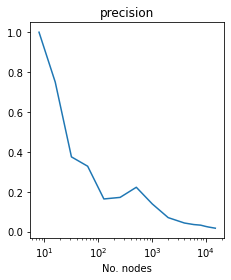

In [11]:
sample_sizes = [8, 16, 32, 64, 128, 256, 512, 1014, 2000, 4000, 6000, 8000, 10000, 11250, 15000]
precs, recs, f1 = precision_recall(pred_fs, Y, *sample_sizes)

print("Total number of samples: {}\n".format(len(Y)))
print("{}\t{}\t{}\t{}".format('samples', 'precision', 'recall', 'f1_score'))
print('-'*40)
for samples, prec, rec, f_1 in zip(sample_sizes, precs, recs, f1):
    print('{}\t{:.3f}\t\t{:.3f}\t{:.3f}'.format(samples, prec, rec, f_1))

plt.figure(figsize=(9, 4))
plt.subplot(131)
plt.plot(sample_sizes, precs)
plt.xscale('log')
plt.title("precision")
plt.xlabel('No. nodes')
plt.tight_layout()

### RandomForest / Unweight

In [12]:
filename = 'models/randomforest/rf_no_weight_highprecision_lowrecall_model.pkl'
rf_model = pickle.load(open(filename, 'rb'))

rf_no_weight_predict = rf_model.predict(X)

fp, tp, _ = sklearn.metrics.roc_curve(Y, rf_no_weight_predict)
auc_score = auc(fp, tp)
print(auc_score)

print(confusion_matrix(Y, rf_no_weight_predict))
print(classification_report(Y, rf_no_weight_predict))

0.7958701176942772
[[9665   73]
 [ 105  157]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      9738
           1       0.68      0.60      0.64       262

    accuracy                           0.98     10000
   macro avg       0.84      0.80      0.81     10000
weighted avg       0.98      0.98      0.98     10000



### RandomForest / Down-sampling

In [13]:
filename = 'models/randomforest/rf_weighted_lowprecision_highrecall_model.pkl'
rf_model2 = pickle.load(open(filename, 'rb'))

rf_weighted_predict = rf_model2.predict(X)

fp, tp, _ = sklearn.metrics.roc_curve(Y, rf_weighted_predict)
auc_score = auc(fp, tp)
print(auc_score)

print(confusion_matrix(Y, rf_weighted_predict))
print(classification_report(Y, rf_weighted_predict))


0.9508108629293599
[[9003  735]
 [   6  256]]
              precision    recall  f1-score   support

           0       1.00      0.92      0.96      9738
           1       0.26      0.98      0.41       262

    accuracy                           0.93     10000
   macro avg       0.63      0.95      0.68     10000
weighted avg       0.98      0.93      0.95     10000



### Keras Classifier / Unweight

In [14]:
Y_np = np.array(Y)
X_np = np.array(X)

In [53]:
keras_classifier_model = keras.models.load_model('models/keras_classifier/no_weight_model_highprecision_lowrecall')

BATCH_SIZE = 2048
keras_classifier_no_weight_predict = keras_classifier_model.predict(X_np, batch_size=BATCH_SIZE)
print(confusion_matrix(Y_np, keras_classifier_no_weight_predict > 0.5))
print(classification_report(Y_np, keras_classifier_no_weight_predict > 0.5))

baseline_results = keras_classifier_model.evaluate(X_np, Y_np, batch_size=BATCH_SIZE, verbose=0)
for name, value in zip(keras_classifier_model.metrics_names, baseline_results):
  print(name, ': ', value)

[[9669   69]
 [  68  194]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      9738
           1       0.74      0.74      0.74       262

    accuracy                           0.99     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.99      0.99      0.99     10000

loss :  0.06843553562164306
tp :  194.0
fp :  69.0
tn :  9669.0
fn :  68.0
accuracy :  0.9863
precision :  0.7376426
recall :  0.740458
auc :  0.921705


### Keras Classifier / Weighted

In [16]:
keras_classifier_model2 = keras.models.load_model('models/keras_classifier/weighted_model_lowprecision_highrecall')

BATCH_SIZE = 2048
keras_classifier_weighted_predict = keras_classifier_model2.predict(X_np, batch_size=BATCH_SIZE)
print(confusion_matrix(Y_np, keras_classifier_weighted_predict > 0.5))
print(classification_report(Y_np, keras_classifier_weighted_predict > 0.5))

baseline_results2 = keras_classifier_model2.evaluate(X_np, Y_np, batch_size=BATCH_SIZE, verbose=0)
for name, value in zip(keras_classifier_model2.metrics_names, baseline_results2):
  print(name, ': ', value)

[[9279  459]
 [  12  250]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.98      9738
           1       0.35      0.95      0.51       262

    accuracy                           0.95     10000
   macro avg       0.68      0.95      0.75     10000
weighted avg       0.98      0.95      0.96     10000

loss :  0.2531372752189636
tp :  250.0
fp :  459.0
tn :  9279.0
fn :  12.0
accuracy :  0.9529
precision :  0.3526093
recall :  0.9541985
auc :  0.98269403


### Keras GraphSage / Unweight

In [17]:
from sklearn import preprocessing
from stellargraph.mapper import DirectedGraphSAGENodeGenerator

G, evaluation_subjects, node_features = generate_stellar_graph(combined_directed_G)

target_encoding = preprocessing.LabelBinarizer()
evaluation_targets = target_encoding.fit_transform(evaluation_subjects)

batch_size = 50
in_samples = [5, 2] # 5 in-directed edges in 1st layer, 2 in 2nd layer
out_samples = [5, 2] # 5 out-directed edge in 1st layer, 2 in 2nd layer

generator = DirectedGraphSAGENodeGenerator(G, batch_size, in_samples, out_samples)
evaluation_gen = generator.flow(evaluation_subjects.index, evaluation_targets, shuffle=True)


In [18]:
keras_graphsage_model = keras.models.load_model('models/keras_graphsage/no_weight_model_highprecision_lowrecall')

keras_graphsage_no_weight_predict = keras_graphsage_model.predict(evaluation_gen)
print(confusion_matrix(evaluation_subjects, keras_graphsage_no_weight_predict > 0.5))
print(classification_report(evaluation_subjects, keras_graphsage_no_weight_predict > 0.5))


[[9728   10]
 [ 262    0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      9738
           1       0.00      0.00      0.00       262

    accuracy                           0.97     10000
   macro avg       0.49      0.50      0.49     10000
weighted avg       0.95      0.97      0.96     10000



### Keras GraphSage / Weighted

In [19]:
keras_graphsage_model = keras.models.load_model('models/keras_graphsage/weighted_model_lowprecision_highrecall')

keras_graphsage_weighted_predict = keras_graphsage_model.predict(evaluation_gen)
print(confusion_matrix(evaluation_subjects, keras_graphsage_weighted_predict > 0.5))
print(classification_report(evaluation_subjects, keras_graphsage_weighted_predict > 0.5))

[[9424  314]
 [ 248   14]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      9738
           1       0.04      0.05      0.05       262

    accuracy                           0.94     10000
   macro avg       0.51      0.51      0.51     10000
weighted avg       0.95      0.94      0.95     10000



# Update graph nodes with AML flags

In [20]:
neg, pos = np.bincount(Y)
total = neg + pos
print('Examples:\n    Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(
    total, pos, 100 * pos / total))

Examples:
    Total: 10000
    Positive: 262 (2.62% of total)



In [21]:
node_list = pd.DataFrame({"truth": Y,
                    "anomaly_types": anomaly_types
                    ,"unsupervised_rank": pred_fs_index
                    ,"rf_unweight": rf_no_weight_predict
                    ,"rf_weight": rf_weighted_predict
                    ,"classifier_unweight": np.rint(keras_classifier_no_weight_predict.flatten()).astype(int)
                    ,"classifier_weight": np.rint(keras_classifier_weighted_predict.flatten()).astype(int)
#                   ,"graphsage_unweight": np.rint(keras_graphsage_no_weight_predict.flatten()).astype(int)
#                   ,"graphsage_weight": np.rint(keras_graphsage_weighted_predict.flatten()).astype(int)
                  })

node_list['sum_all_model'] = node_list['rf_unweight'] + node_list['rf_weight'] + node_list['classifier_unweight'] + node_list['classifier_weight'] # + node_list['graphsage_unweight'] + node_list['graphsage_weight']
node_list['sum_unweighted_model'] = node_list['rf_unweight'] + node_list['classifier_unweight'] 
node_list['sum_weighted_model'] = node_list['rf_weight'] + node_list['classifier_weight']

### Evaluation 1 (Unsupervised Feature Sum)

In [22]:
node_list.sort_values(by=['unsupervised_rank'], ascending=True).head(2000)

# node_list.sort_values(by=['truth', 'sum_all_model', 'sum_unweighted_model'], ascending=[False, False, False]).head(2000)
# node_list.sort_values(by=['sum_all_model', 'unsupervised_rank'], ascending=[False, False]).head(2000)
# node_list.sort_index()

,truth,anomaly_types,unsupervised_rank,rf_unweight,rf_weight,classifier_unweight,classifier_weight,sum_all_model,sum_unweighted_model,sum_weighted_model
2078,1,clique,0,1,1,1,1,4,2,2
3435,1,clique,1,1,1,1,1,4,2,2
4878,1,clique,2,1,1,1,1,4,2,2
5852,1,clique,3,1,1,1,1,4,2,2
7778,1,clique,4,1,1,1,1,4,2,2
608,1,clique,5,1,1,1,1,4,2,2
2731,1,clique,6,1,1,1,1,4,2,2
7383,1,clique,7,1,1,1,1,4,2,2
3331,1,clique,8,1,1,1,1,4,2,2
4737,1,clique,9,1,1,1,1,4,2,2


### Evaluation 2 (Supervised models)

In [23]:
node_list.sort_values(by=['sum_all_model', 'sum_unweighted_model', 'unsupervised_rank'], ascending=[False, False, True]).head(5000)


,truth,anomaly_types,unsupervised_rank,rf_unweight,rf_weight,classifier_unweight,classifier_weight,sum_all_model,sum_unweighted_model,sum_weighted_model
2078,1,clique,0,1,1,1,1,4,2,2
3435,1,clique,1,1,1,1,1,4,2,2
4878,1,clique,2,1,1,1,1,4,2,2
5852,1,clique,3,1,1,1,1,4,2,2
7778,1,clique,4,1,1,1,1,4,2,2
608,1,clique,5,1,1,1,1,4,2,2
2731,1,clique,6,1,1,1,1,4,2,2
7383,1,clique,7,1,1,1,1,4,2,2
3331,1,clique,8,1,1,1,1,4,2,2
4737,1,clique,9,1,1,1,1,4,2,2


In [55]:
sum_of_4 = node_list[node_list['sum_all_model'] == 4]['truth']
print(sum_of_4.value_counts())
print(len(sum_of_4))
print(classification_report(sum_of_4, np.ones(len(sum_of_4))))

1    122
0     20
Name: truth, dtype: int64
142
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.86      1.00      0.92       122

    accuracy                           0.86       142
   macro avg       0.43      0.50      0.46       142
weighted avg       0.74      0.86      0.79       142



C:\Users\ttr\Anaconda3\envs\july\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [32]:
sum_of_4 = node_list[node_list['sum_all_model'] == 3]['truth']
print(sum_of_4.value_counts())
print(len(sum_of_4))
print(classification_report(sum_of_4, np.ones(len(sum_of_4))))

1    102
0     68
Name: truth, dtype: int64
170
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        68
           1       0.60      1.00      0.75       102

    accuracy                           0.60       170
   macro avg       0.30      0.50      0.37       170
weighted avg       0.36      0.60      0.45       170



C:\Users\ttr\Anaconda3\envs\july\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Evaluation 3 (Unweighted models ~ High Precision, Low Recall)

In [34]:
node_list.sort_values(by=['sum_unweighted_model', 'unsupervised_rank'], ascending=[False, True]).head(5000)


,truth,anomaly_types,unsupervised_rank,rf_unweight,rf_weight,classifier_unweight,classifier_weight,sum_all_model,sum_unweighted_model,sum_weighted_model
2078,1,clique,0,1,1,1,1,4,2,2
3435,1,clique,1,1,1,1,1,4,2,2
4878,1,clique,2,1,1,1,1,4,2,2
5852,1,clique,3,1,1,1,1,4,2,2
7778,1,clique,4,1,1,1,1,4,2,2
608,1,clique,5,1,1,1,1,4,2,2
2731,1,clique,6,1,1,1,1,4,2,2
7383,1,clique,7,1,1,1,1,4,2,2
3331,1,clique,8,1,1,1,1,4,2,2
4737,1,clique,9,1,1,1,1,4,2,2


In [36]:
sum_of_6 = node_list[node_list['sum_unweighted_model'] == 2]['truth']
print(sum_of_6.value_counts())
print(len(sum_of_6))
print(classification_report(sum_of_6, np.ones(len(sum_of_6))))

1    122
0     20
Name: truth, dtype: int64
142
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        20
           1       0.86      1.00      0.92       122

    accuracy                           0.86       142
   macro avg       0.43      0.50      0.46       142
weighted avg       0.74      0.86      0.79       142



C:\Users\ttr\Anaconda3\envs\july\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [37]:
sum_of_6 = node_list[node_list['sum_unweighted_model'] >= 1]['truth']
print(sum_of_6.value_counts())
print(len(sum_of_6))
print(classification_report(sum_of_6, np.ones(len(sum_of_6))))

1    229
0    122
Name: truth, dtype: int64
351
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       122
           1       0.65      1.00      0.79       229

    accuracy                           0.65       351
   macro avg       0.33      0.50      0.39       351
weighted avg       0.43      0.65      0.52       351



C:\Users\ttr\Anaconda3\envs\july\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Evaluation 4 (Weighted models ~ Low Precision, High Recall)

In [38]:
node_list.sort_values(by=['sum_weighted_model', 'unsupervised_rank'], ascending=[False, True]).head(5000)


,truth,anomaly_types,unsupervised_rank,rf_unweight,rf_weight,classifier_unweight,classifier_weight,sum_all_model,sum_unweighted_model,sum_weighted_model
2078,1,clique,0,1,1,1,1,4,2,2
3435,1,clique,1,1,1,1,1,4,2,2
4878,1,clique,2,1,1,1,1,4,2,2
5852,1,clique,3,1,1,1,1,4,2,2
7778,1,clique,4,1,1,1,1,4,2,2
608,1,clique,5,1,1,1,1,4,2,2
2731,1,clique,6,1,1,1,1,4,2,2
7383,1,clique,7,1,1,1,1,4,2,2
3331,1,clique,8,1,1,1,1,4,2,2
4737,1,clique,9,1,1,1,1,4,2,2


In [39]:
sum_of_6 = node_list[node_list['sum_weighted_model'] == 2]['truth']
print(sum_of_6.value_counts())
print(len(sum_of_6))
print(classification_report(sum_of_6, np.ones(len(sum_of_6))))

0    297
1    248
Name: truth, dtype: int64
545
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       297
           1       0.46      1.00      0.63       248

    accuracy                           0.46       545
   macro avg       0.23      0.50      0.31       545
weighted avg       0.21      0.46      0.28       545



C:\Users\ttr\Anaconda3\envs\july\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Persist the nodes (accounts) and edges (transactions) and the predicted anomalous labels to Neo4j


In [40]:
from stellargraph import datasets
from IPython.display import display, HTML
import time
import py2neo
from py2neo import Graph, Node

In [45]:
# Create the Neo4j Graph database object; the arguments can be edited to specify location and authentication
graph = py2neo.Graph(host='localhost', port=7687, user='neo4j', password='123456')


In [46]:
# Delete the existing edges and relationships in the current database.

empty_db_query = """
    MATCH(n) DETACH
    DELETE(n)
    """

tx = graph.auto()
tx.evaluate(empty_db_query)

In [47]:
# Delete any existing constraints or indexes in the current database.

constraints = graph.run("CALL db.constraints").data()
for constraint in constraints:
    graph.run(f"DROP CONSTRAINT {constraint['name']}")

indexes = graph.run("CALL db.indexes").data()
for index in indexes:
    graph.run(f"DROP INDEX {index['name']}")

In [48]:
def get_node_label_list(node):
    labels = ['account']
    if node['truth'] == 1:
        labels.append('truth')
    if node['anomaly_types'] != 0:
        labels.append(node['anomaly_types'])
    if node['rf_unweight'] == 1:
        labels.append('rf_unweight')
    if node['rf_weight'] == 1:
        labels.append('rf_weight')
    if node['classifier_unweight'] == 1:
        labels.append('classifier_unweight')
    if node['classifier_weight'] == 1:
        labels.append('classifier_weight')
    if node['sum_all_model'] > 0:
        labels.append('sum_anomaly_' + str(node['sum_all_model']))
    return labels
    

In [49]:
for index, node in node_list.iterrows():
    labels = get_node_label_list(node)
    account = Node(*labels, ID=int(index), unsupervised_rank=int(node['unsupervised_rank']))
    graph.create(account)


In [50]:
# Load all nodes to the graph database.

loading_node_query = """
    UNWIND $node_list as node
    CREATE( e: account {
        ID: toInteger(node.id),
        subject: node.subject
    })
    """

# For efficient loading, we will load batch of nodes into Neo4j.
batch_len = 500

for batch_start in range(0, len(node_list), batch_len):
    batch_end = batch_start + batch_len
    # turn node dataframe into a list of records
    records = node_list.iloc[batch_start:batch_end].to_dict("records")
    tx = graph.auto()
    tx.evaluate(loading_node_query, parameters={"node_list": records})

In [51]:
edge_list.head(10)

,source,target,weight,label
0,0,984,0.680286,send
1,0,1689,0.501596,send
2,0,2206,0.621175,send
3,0,2288,0.016438,send
4,0,5064,0.058072,send
5,0,5496,0.350495,send
6,0,8634,0.058285,send
7,0,9694,0.802865,send
8,0,243,0.414431,send
9,0,808,0.084361,send


In [52]:
# Load all edges to the graph database.

loading_edge_query = """
    UNWIND $edge_list as edge
    
    MATCH(source: account {ID: toInteger(edge.source)})
    MATCH(target: account {ID: toInteger(edge.target)})
    
    MERGE (source)-[r:send {weight:edge.weight}]->(target)
    """

batch_len = 500

for batch_start in range(0, len(edge_list), batch_len):
    batch_end = batch_start + batch_len
    # turn edge dataframe into a list of records
    records = edge_list.iloc[batch_start:batch_end].to_dict("records")
    tx = graph.auto()
    tx.evaluate(loading_edge_query, parameters={"edge_list": records})

In [54]:
# Ensure node IDs are unique. Creating this constraint also automatically creates an index 
# which will improve performance of querying nodes by ID.

node_id_constraint = """
    CREATE CONSTRAINT
    ON (n:paper)
    ASSERT n.ID IS UNIQUE
    """

tx = graph.auto()
tx.evaluate(node_id_constraint)